In [1]:
import pandas as pd
import scanpy as sc
from anndata import concat
import matplotlib.pyplot as plt

from glob import glob

In [2]:
matrixlist = glob('../2024*/*/cell_feature_matrix.h5')

In [3]:
adata = []
for file in matrixlist:
    A = sc.read_10x_h5(file)
    A.obs['Date'] = file.split('/')[1].split('__')[0]
    A.obs['Slide'] = file.split('/')[2].split('__')[1]
    A.obs['Sample'] = file.split('/')[2].split('__')[2].replace('M','')
    A.obs['Tissue'] = file.split('/')[2].split('__')[2].replace('M','')[0]
    adata.append(A)

In [4]:
adata = concat(adata)
adata.obs_names_make_unique()

meta = pd.read_csv('7b_meta.csv',index_col=0)
for feature in ['Sex','Genotype','Age (Weeks)']:
    adata.obs[feature] = adata.obs['Sample'].map(meta[feature].to_dict())

/Users/pranzatellitj/Library/Python/3.11/lib/python/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [5]:
adata.raw = adata

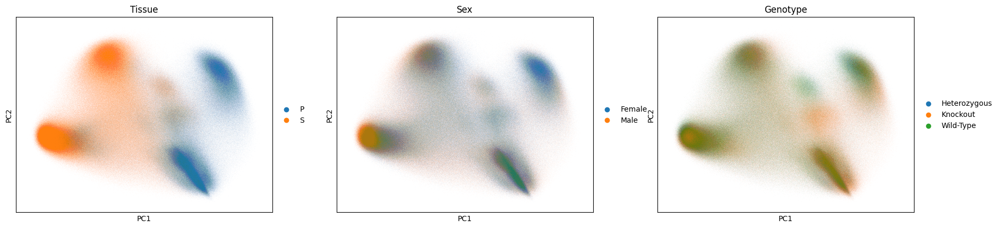

In [6]:
sc.pp.filter_cells(adata,min_genes=10)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.tl.pca(adata)
sc.pl.pca(adata,color=['Tissue','Sex','Genotype'])

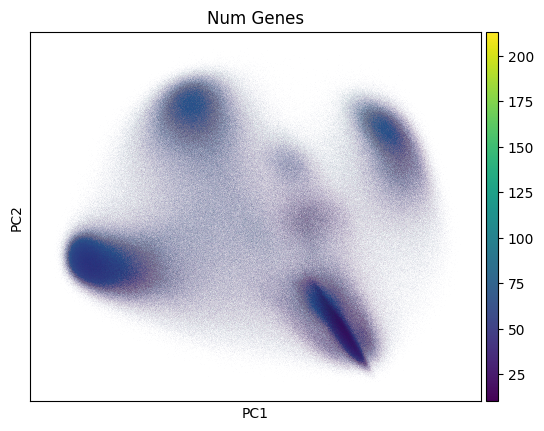

In [7]:
adata.obs['Num Genes'] = (adata.X > 0).sum(axis=1).A1
sc.pl.pca(adata,color='Num Genes')

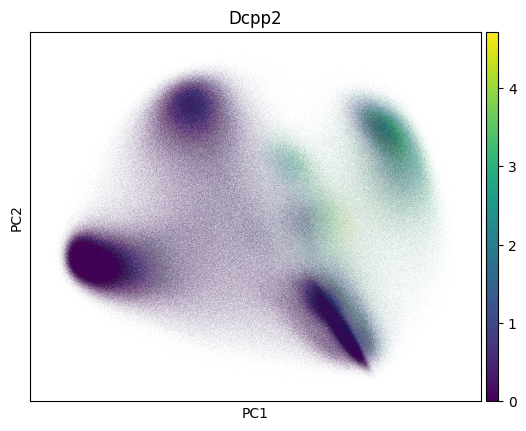

In [8]:
sc.pl.pca(adata,color='Dcpp2',use_raw=False)

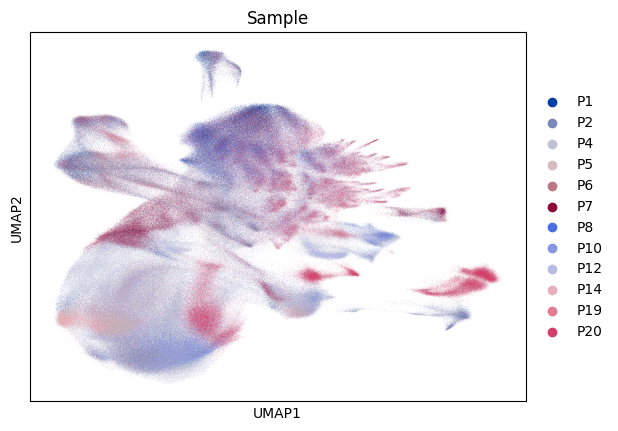

In [17]:
adataP = adata[adata.obs['Tissue'] == 'P']
sc.pp.neighbors(adataP)
sc.tl.umap(adataP)
sc.pl.umap(adataP,color='Sample')

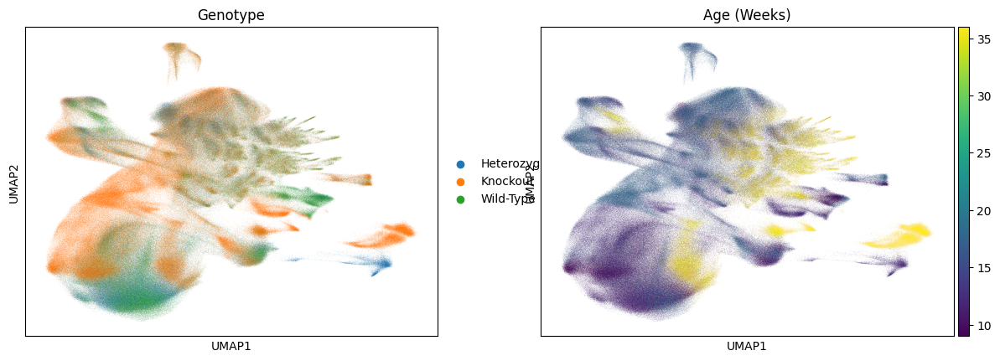

In [47]:
sc.pl.umap(adataP,color=['Genotype','Age (Weeks)'])

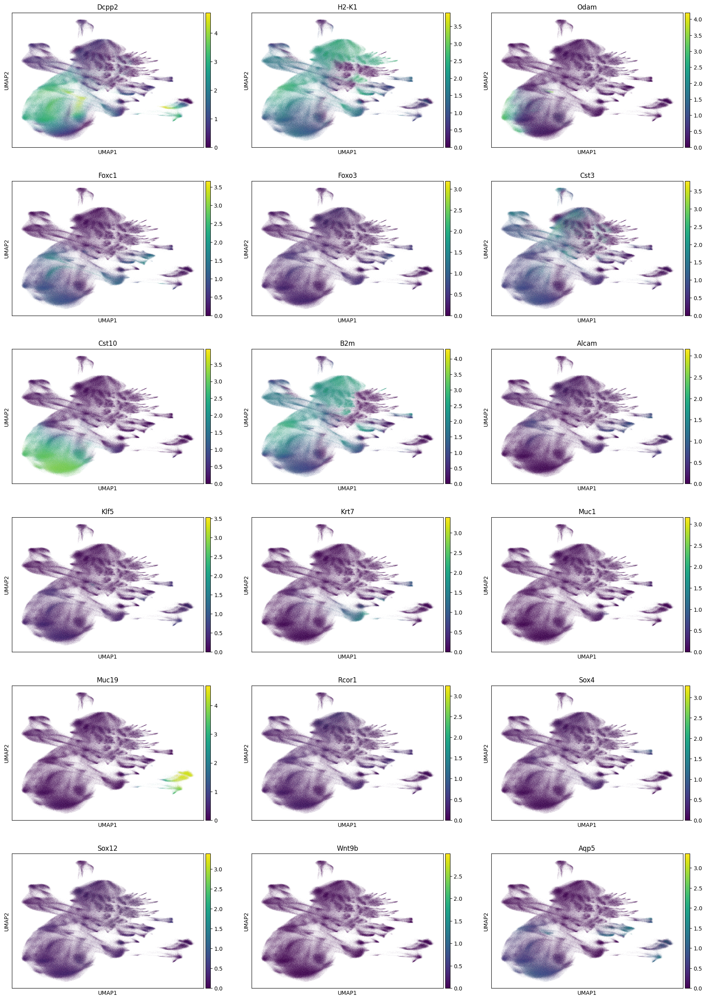

In [42]:
sc.pl.umap(adataP,color=['Dcpp2','H2-K1','Odam','Foxc1','Foxo3','Cst3','Cst10','B2m','Krt7','Muc1','Muc19','Aqp5'],use_raw=False,ncols=3)

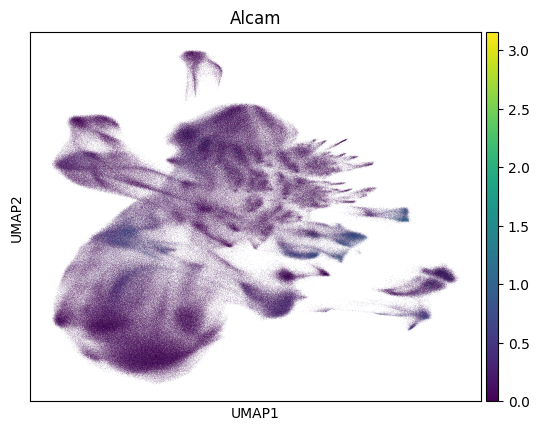

In [49]:
sc.pl.umap(adataP,color='Alcam',use_raw=False)

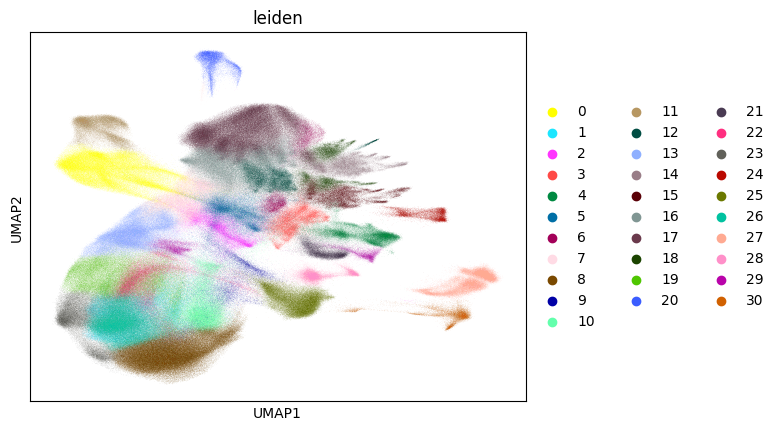

In [20]:
sc.tl.leiden(adataP,flavor='igraph',n_iterations=2)
sc.pl.umap(adataP,color='leiden')

In [37]:
xtab = pd.crosstab(adataP.obs['leiden'],adata.obs['Genotype'])
xtab = xtab/xtab.sum() * 100
(xtab['Knockout'] / xtab['Wild-Type']).sort_values()[-10:]

leiden
19      2.232460
23      2.624659
24      3.532015
10      3.955111
7       6.077590
28      6.290167
21     18.600353
30     24.356330
13    171.666343
27    391.221686
dtype: float64

/Users/pranzatellitj/Library/Python/3.11/lib/python/site-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/Users/pranzatellitj/Library/Python/3.11/lib/python/site-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/Users/pranzatellitj/Library/Python/3.11/lib/python/site-packages/scanpy/tools/_rank_genes_groups.py:440: P

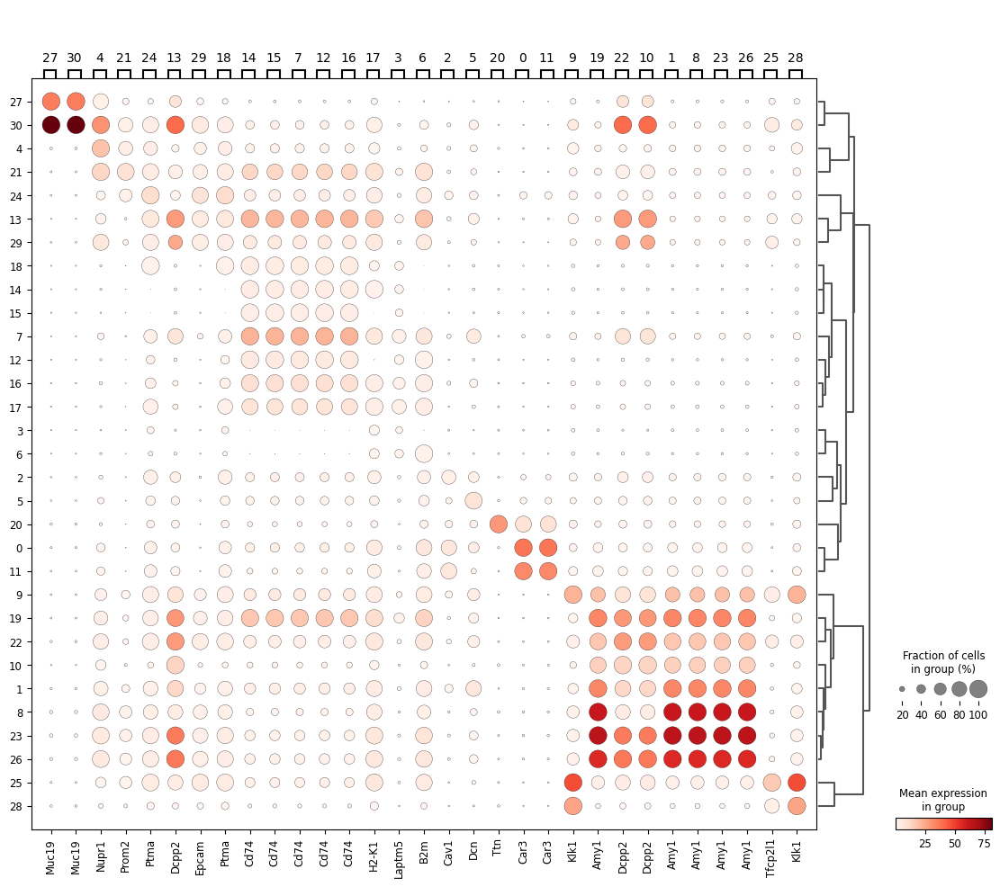

In [28]:
sc.tl.rank_genes_groups(adataP,groupby='leiden',use_raw=False)
sc.pl.rank_genes_groups_dotplot(adataP,n_genes=1)

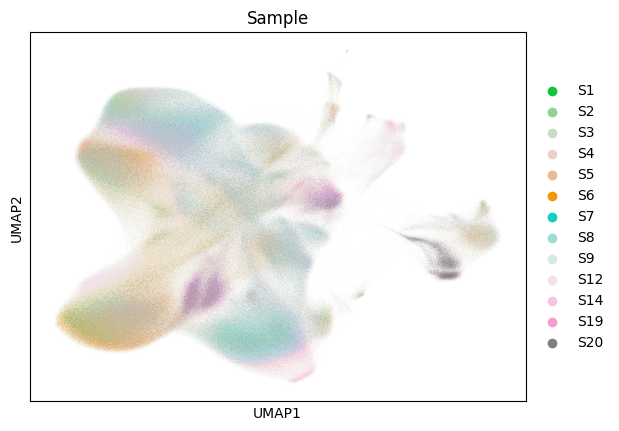

In [21]:
adataS = adata[adata.obs['Tissue'] == 'S']
sc.pp.neighbors(adataS)
sc.tl.umap(adataS)
sc.pl.umap(adataS,color='Sample')

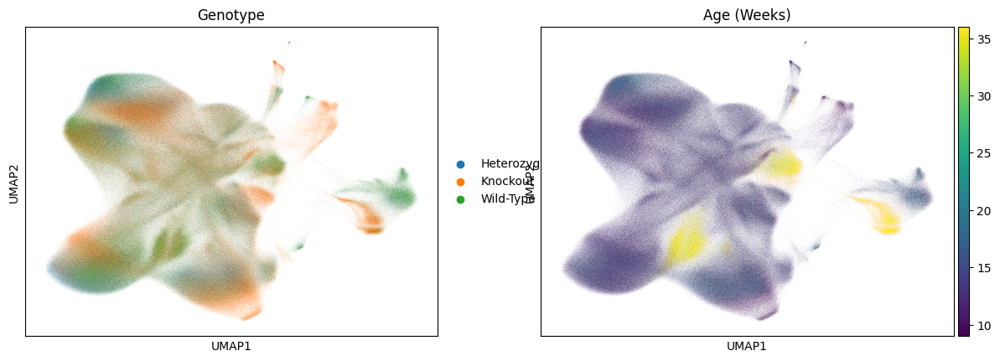

In [46]:
sc.pl.umap(adataS,color=['Genotype','Age (Weeks)'])

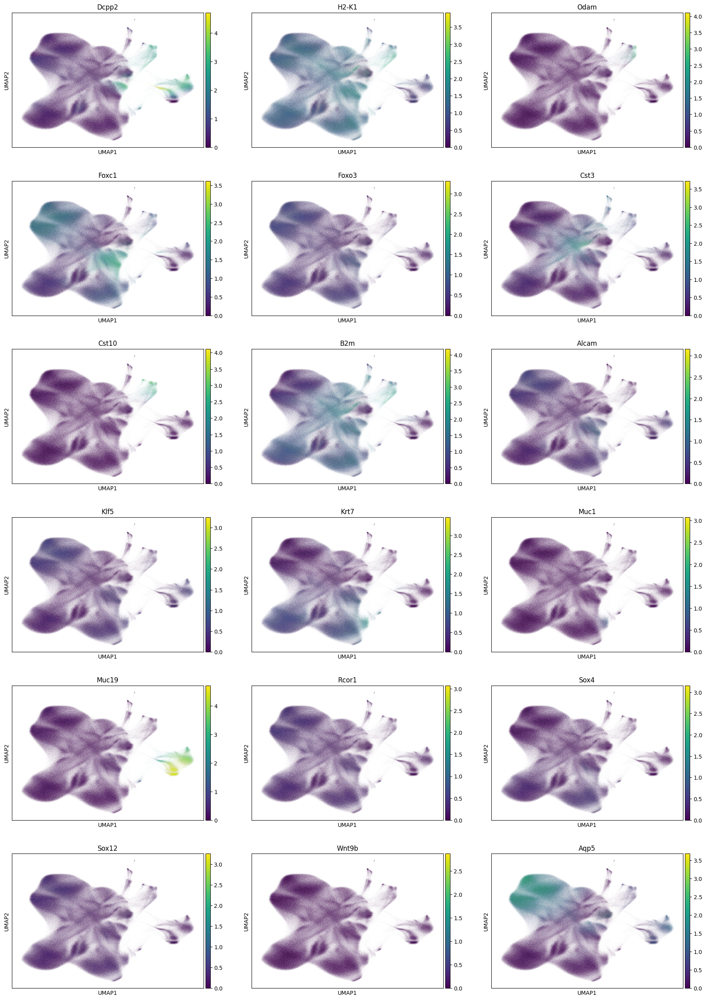

In [44]:
sc.pl.umap(adataS,color=['Dcpp2','H2-K1','Odam','Foxc1','Foxo3','Cst3','Cst10','B2m','Alcam','Klf5','Krt7','Muc1','Muc19','Aqp5'],use_raw=False,ncols=3)